In [2]:
from tools import dem_from_mml, delineate_catchment_from_dem, fill_cmask_holes, vmi_from_puhti, dem_from_puhti_2m, resample_raster
from tools import soilmap_from_puhti, needlemass_to_lai, maastolayer_to_raster, resample_raster_set
from tools import burn_water_dem
import pandas as pd
import numpy as np

# inputs parameters
#subset = [370000,7537500,390000,7557500] # coordinate box of the dem, PALLAS
subset = [348000,6857000,360000,6865000] # coordinate box of the dem, KUIVAJARVI
#subset = [352000,6857000,360000,6865000] # coordinate box of the dem, KUIVAJARVI

apifile = r'/scratch/project_2000908/nousu/GISPUTS/apikey.txt' # api-key for MML database (registration needed)
apikey = np.loadtxt(apifile, dtype='str') # api-key loaded from a txt-file

# reading stream outlet file
#streams_file = '/scratch/project_2000908/nousu/GISPUTS/Kuivalake_Catchment/stream_outlets_edit_24.csv'
#streams = pd.read_csv(streams_file, sep=';', usecols=['stream'], encoding = "ISO-8859-1")['stream'].to_list()

# output file directory
out_fd = r'/scratch/project_2000908/nousu/GISPUTS/Kuivalake_Catchment/GIS_inputs/kuivajarvi/dem_32/'

#### Downloading DEM subset from Puhti and resampling

In [1]:
fp = r'/appl/data/geo/mml/dem2m/dem2m_direct.vrt'
out_fp = r'/scratch/project_2000908/nousu/GISPUTS/Kuivalake_Catchment/GIS_inputs/kuivajarvi/dem_32/puhti_dem_2m.tif'

dem_from_puhti_2m(fp, subset, out_fp, plot=True, save_in='geotiff')

fp = r'/scratch/project_2000908/nousu/GISPUTS/Kuivalake_Catchment/GIS_inputs/kuivajarvi/dem_32/puhti_dem_2m.tif'
out_fp = r'/scratch/project_2000908/nousu/GISPUTS/Kuivalake_Catchment/GIS_inputs/kuivajarvi/dem_32/puhti_dem_32m.tif'
scale_factor=0.0625 # to 32m

dem, out_fp = resample_raster(fp=fp, out_fp=out_fp, scale_factor=scale_factor)

NameError: name 'dem_from_puhti_2m' is not defined

#### Burn water elements to dem

In [3]:
vive_fn = r'/appl/data/geo/mml/maastotietokanta/2023/gpkg/MTK-virtavesi_23-03-02.gpkg'
vave_fn = r'/appl/data/geo/mml/maastotietokanta/2023/gpkg/MTK-vakavesi_23-03-02.gpkg'
out_fd_m = r'/scratch/project_2000908/nousu/GISPUTS/Kuivalake_Catchment/GIS_inputs/kuivajarvi/maastotietokanta_32'

maastolayer_to_raster(in_fn=vive_fn, out_fd=out_fd_m, layer='virtavesikapea', ref_raster=out_fp, plot=False)
maastolayer_to_raster(in_fn=vave_fn, out_fd=out_fd_m, layer='jarvi', ref_raster=out_fp, plot=False)

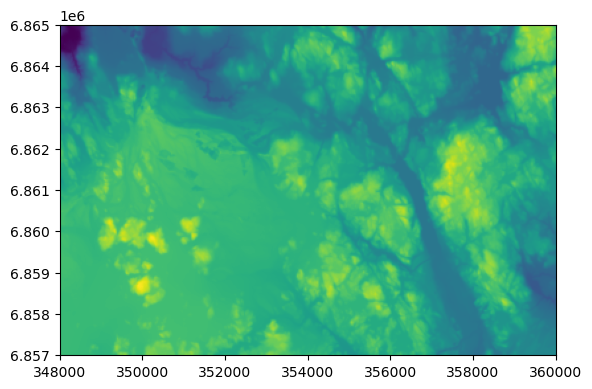

In [5]:
stream = r'/scratch/project_2000908/nousu/GISPUTS/Kuivalake_Catchment/GIS_inputs/kuivajarvi/maastotietokanta_32/virtavesikapea.asc'
lake = r'/scratch/project_2000908/nousu/GISPUTS/Kuivalake_Catchment/GIS_inputs/kuivajarvi/maastotietokanta_32/jarvi.asc'

fdem, out_fp = burn_water_dem(dem_fp=out_fp, stream_fp=stream, lake_fp=lake)

#### Delineate catchment


*** Delineating 0 catchment ***
*** 0 catchment is delineated and DEM derivatives are saved ***

*** Delineating 1 catchment ***
*** 1 catchment is delineated and DEM derivatives are saved ***

*** Delineating 2 catchment ***
*** 2 catchment is delineated and DEM derivatives are saved ***

*** Delineating 3 catchment ***
*** 3 catchment is delineated and DEM derivatives are saved ***

*** Delineating 4 catchment ***
*** 4 catchment is delineated and DEM derivatives are saved ***

*** Delineating 5 catchment ***
*** 5 catchment is delineated and DEM derivatives are saved ***

*** Delineating 6 catchment ***
*** 6 catchment is delineated and DEM derivatives are saved ***

*** Delineating 7 catchment ***
*** 7 catchment is delineated and DEM derivatives are saved ***

*** Delineating 8 catchment ***
*** 8 catchment is delineated and DEM derivatives are saved ***

*** Delineating 9 catchment ***
*** 9 catchment is delineated and DEM derivatives are saved ***

*** Delineating 10 catchment 

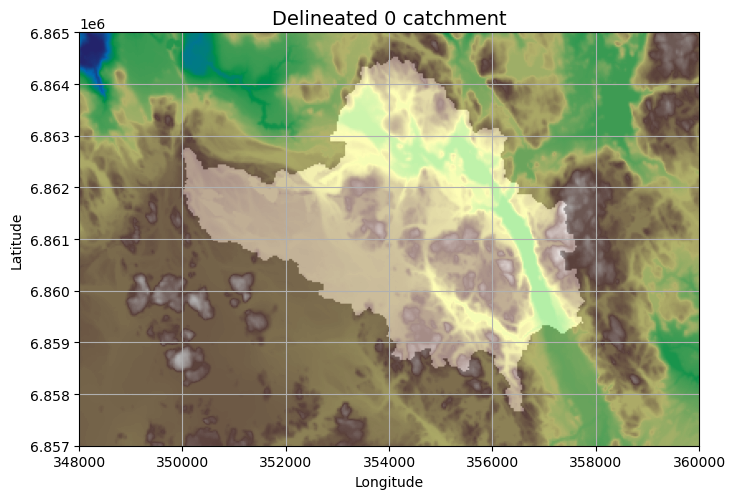

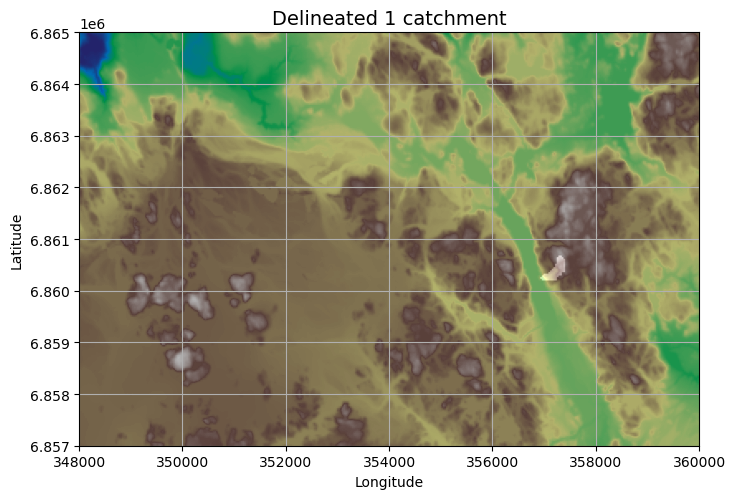

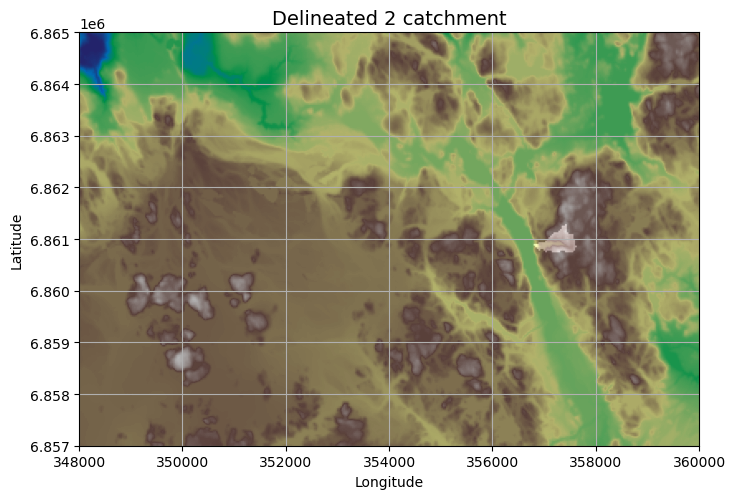

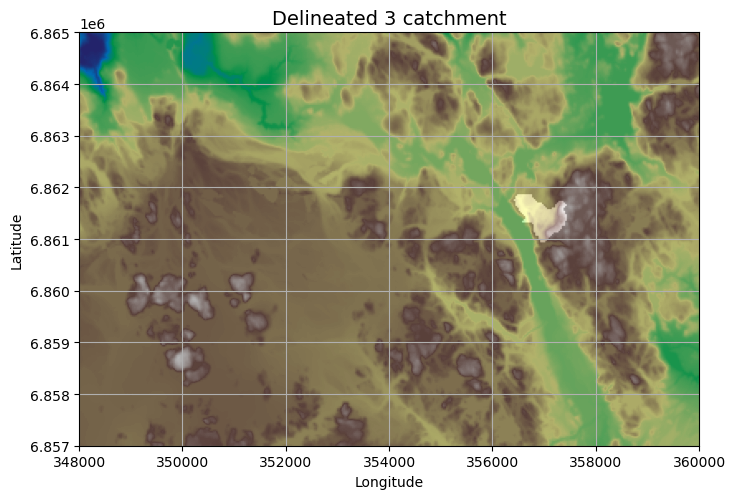

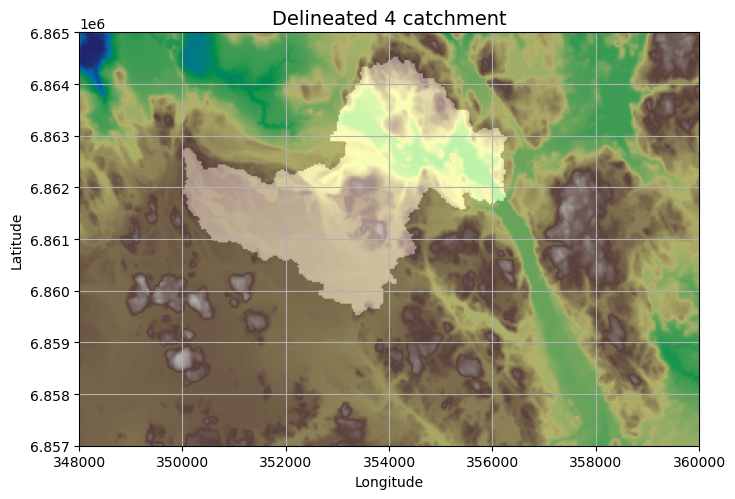

...

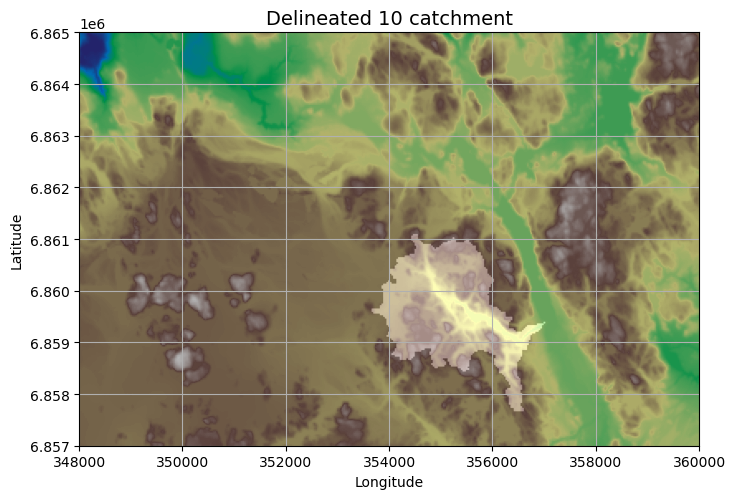

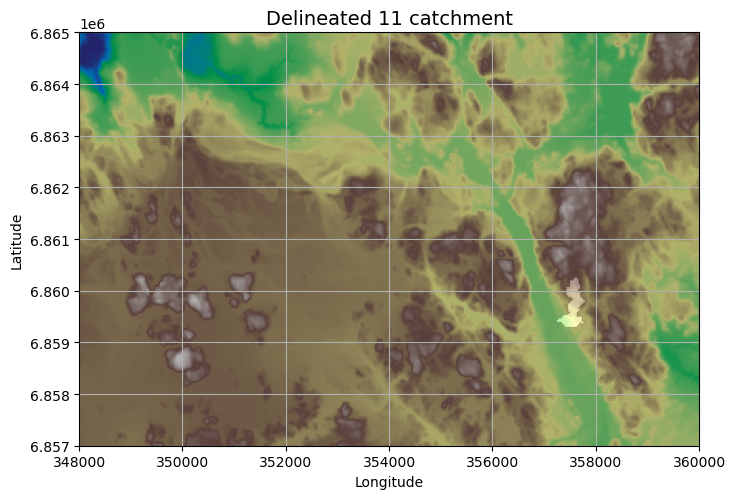

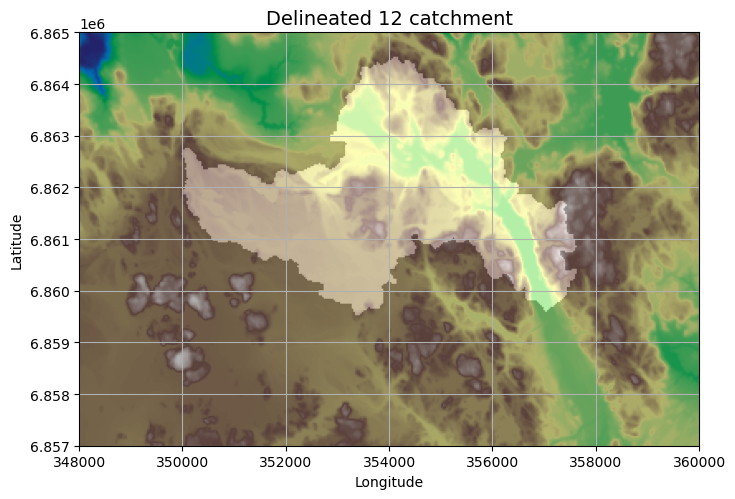

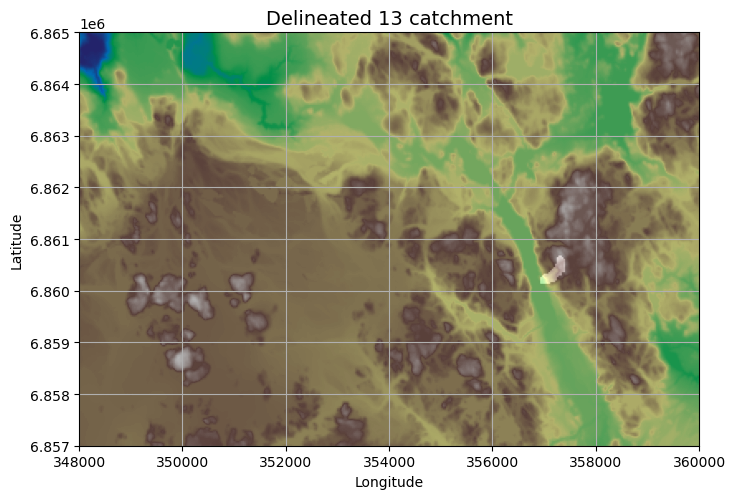

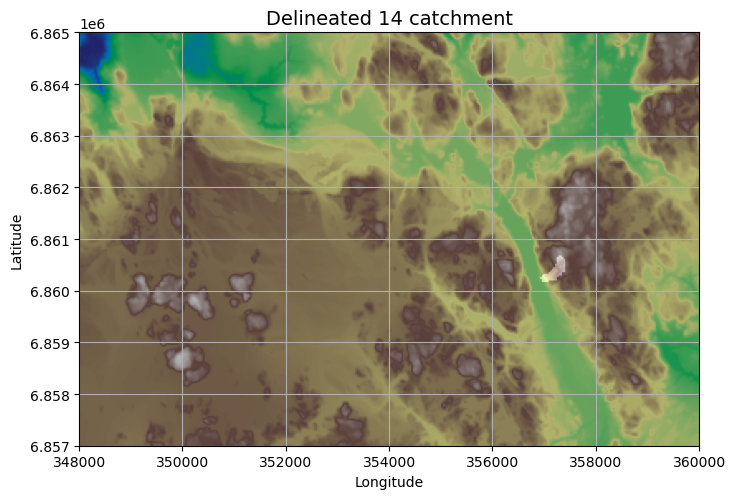

In [6]:
for catchment_name in streams:
    delineate_catchment_from_dem(dem_path=out_fp,
                                 catchment_name=catchment_name,
                                 out_fd=out_fd,
                                 outlet_file=streams_file,
                                 routing='d8',
                                 clip_catchment=False,
                                 fill_holes=True)

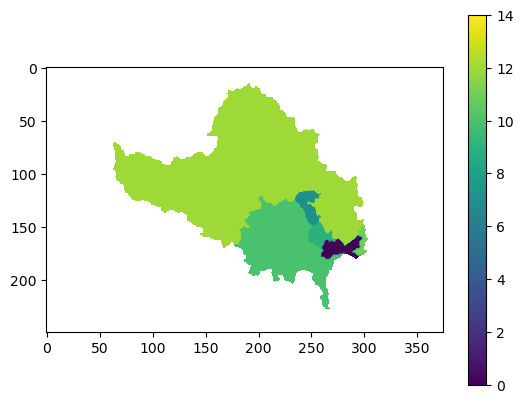

In [7]:
from tools import common_cmask
import glob
fd = '/scratch/project_2000908/nousu/GISPUTS/Kuivalake_Catchment/GIS_inputs/kuivajarvi/dem_32/*fill.asc'
files = glob.glob(fd)
final_data = common_cmask(files)

#### Loading, interpolating and resampling VMI data

/appl/data/geo/luke/vmi/2021/bm_manty_latva_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


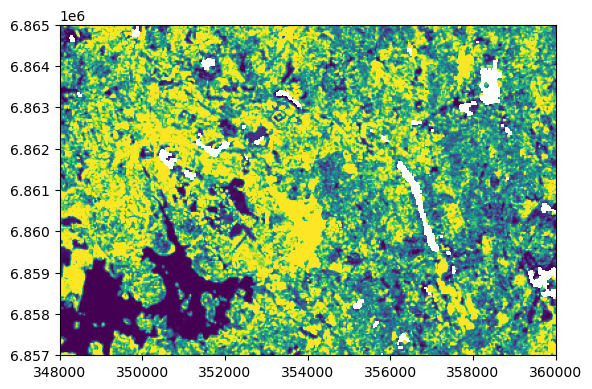

/appl/data/geo/luke/vmi/2021/bm_kuusi_elavatoksat_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


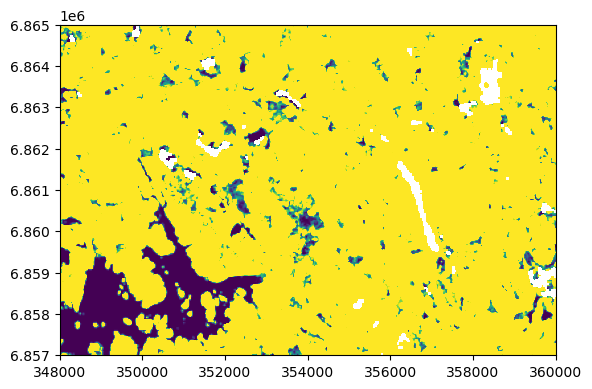

/appl/data/geo/luke/vmi/2021/bm_kuusi_runkokuori_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


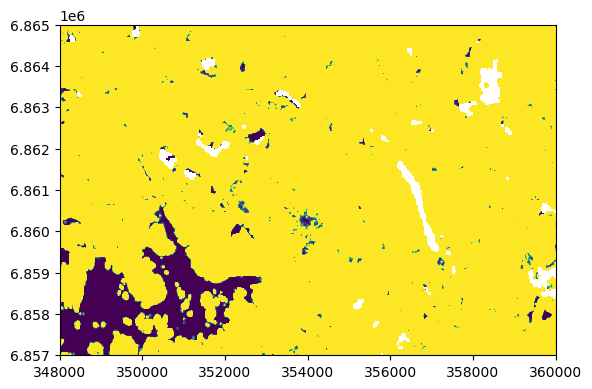

/appl/data/geo/luke/vmi/2021/bm_manty_elavatoksat_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


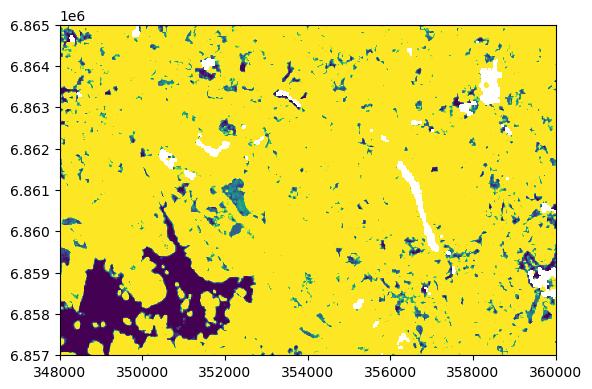

/appl/data/geo/luke/vmi/2021/mantytukki_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


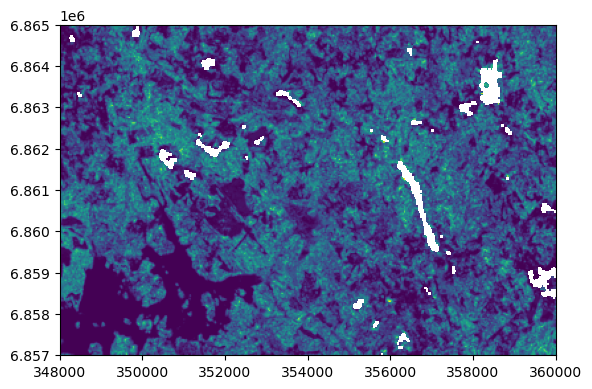

/appl/data/geo/luke/vmi/2021/keskilapimitta_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


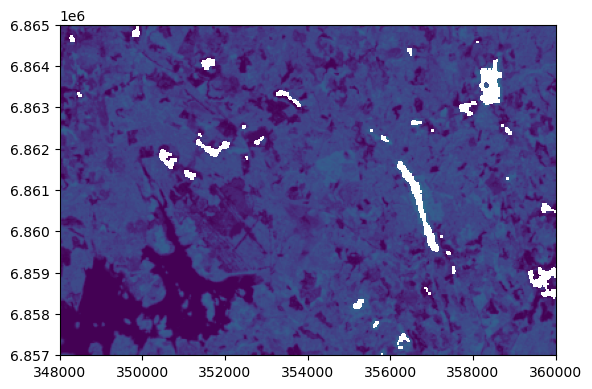

/appl/data/geo/luke/vmi/2021/manty_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


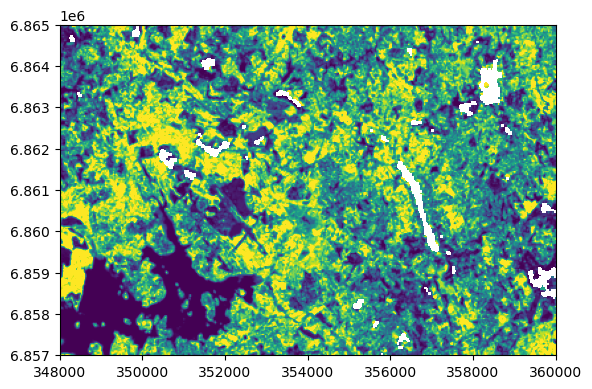

/appl/data/geo/luke/vmi/2021/bm_manty_neulaset_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


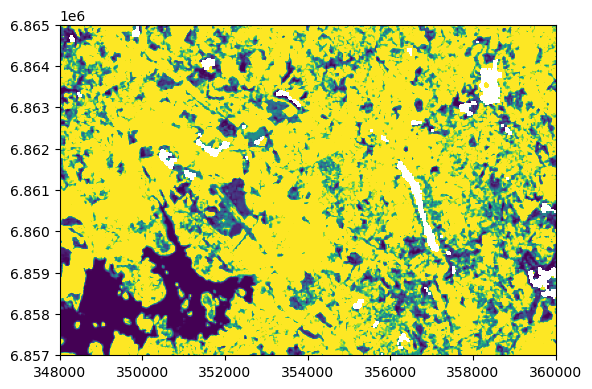

/appl/data/geo/luke/vmi/2021/muulpkuitu_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


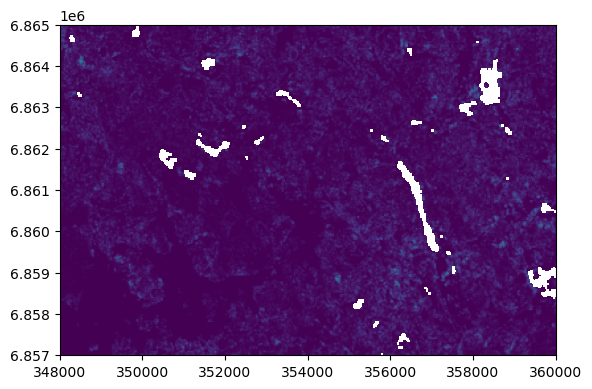

/appl/data/geo/luke/vmi/2021/bm_manty_runkokuori_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


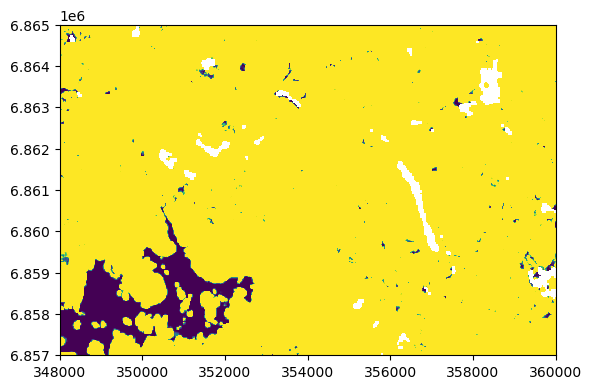

/appl/data/geo/luke/vmi/2021/latvuspeitto_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


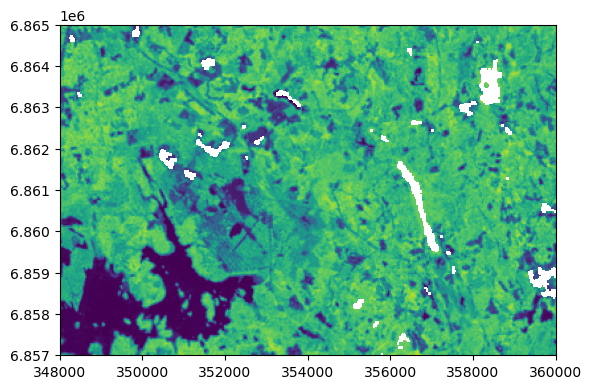

/appl/data/geo/luke/vmi/2021/bm_lehtip_juuret_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


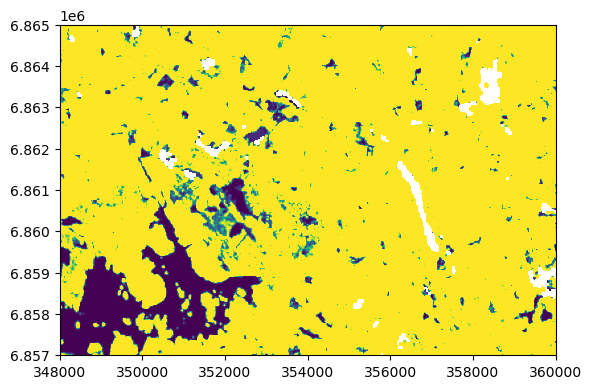

/appl/data/geo/luke/vmi/2021/bm_kuusi_latva_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


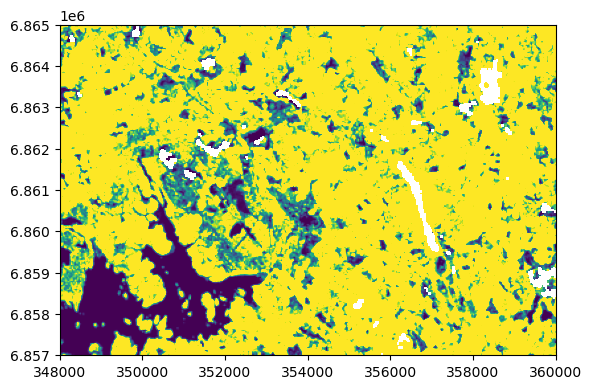

/appl/data/geo/luke/vmi/2021/maaluokka_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


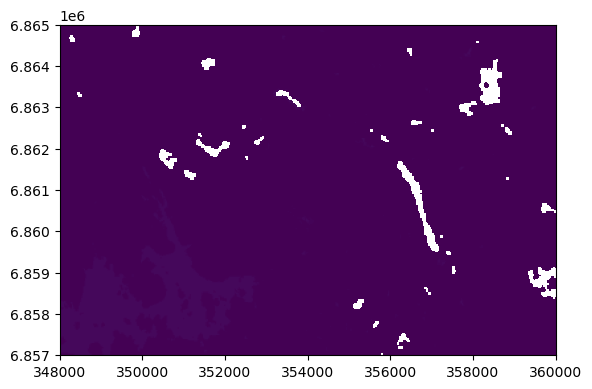

/appl/data/geo/luke/vmi/2021/kasvupaikka_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


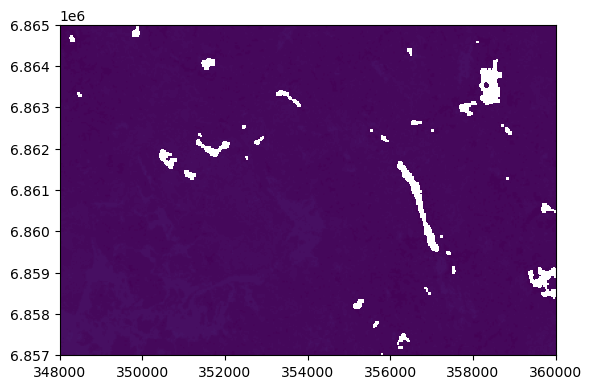

/appl/data/geo/luke/vmi/2021/ika_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


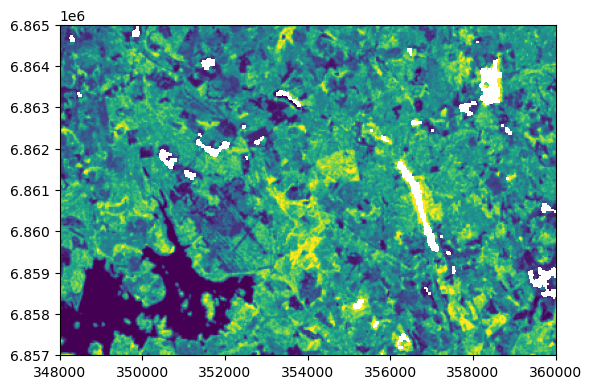

/appl/data/geo/luke/vmi/2021/koivutukki_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


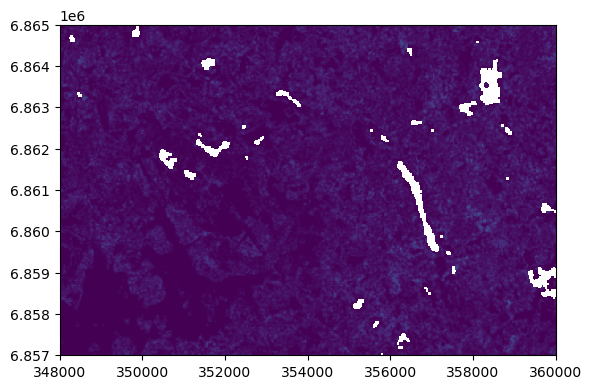

/appl/data/geo/luke/vmi/2021/bm_manty_kanto_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


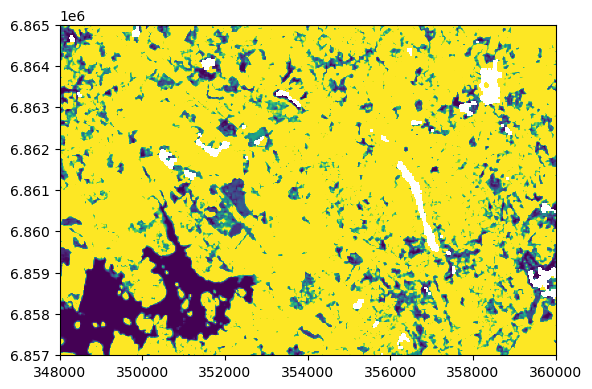

/appl/data/geo/luke/vmi/2021/bm_lehtip_latva_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


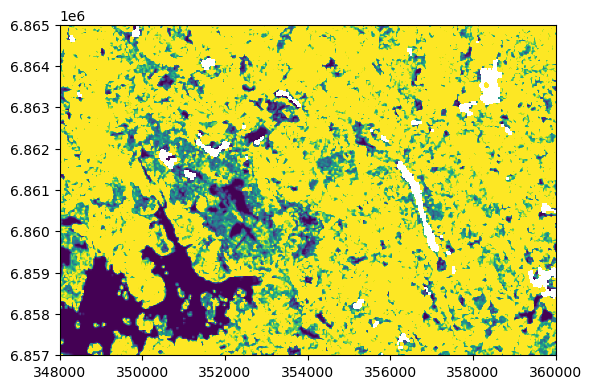

/appl/data/geo/luke/vmi/2021/bm_lehtip_kuolleetoksat_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


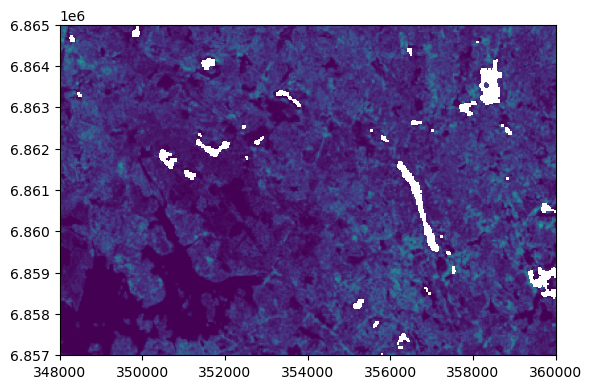

/appl/data/geo/luke/vmi/2021/kuusikuitu_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


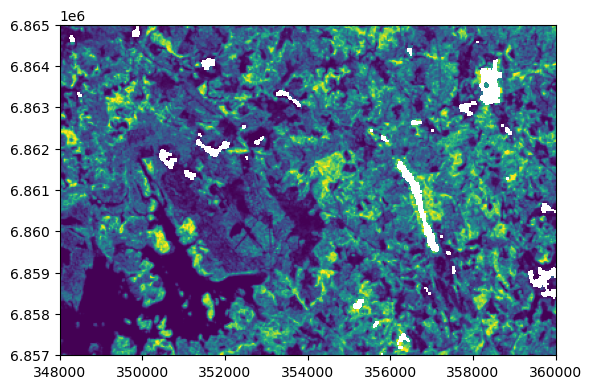

/appl/data/geo/luke/vmi/2021/paatyyppi_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


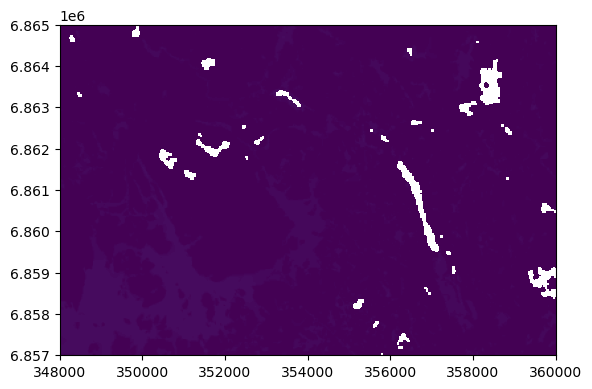

/appl/data/geo/luke/vmi/2021/koivu_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


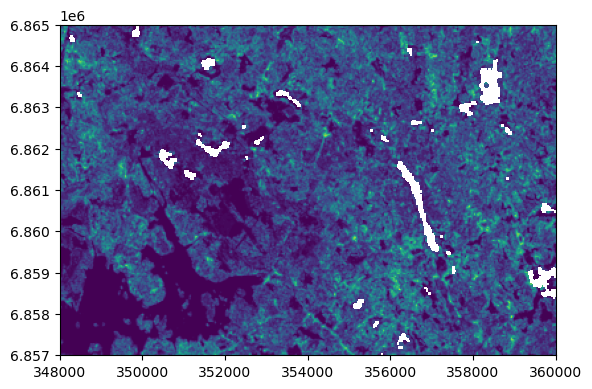

/appl/data/geo/luke/vmi/2021/lehtip_latvuspeitto_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


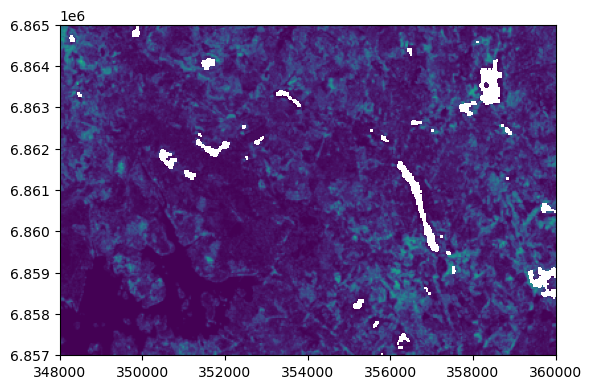

/appl/data/geo/luke/vmi/2021/bm_kuusi_kanto_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


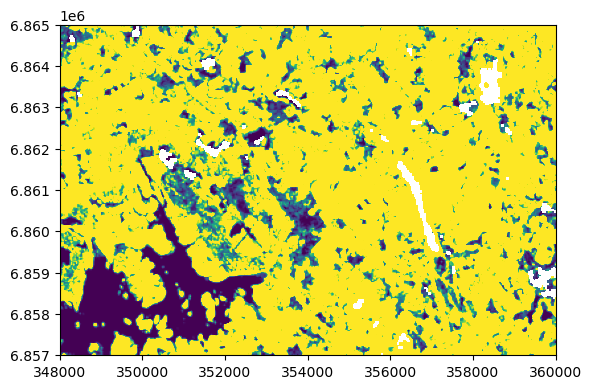

/appl/data/geo/luke/vmi/2021/muulptukki_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


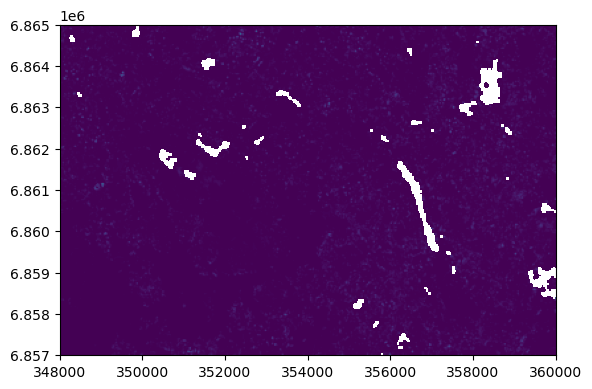

/appl/data/geo/luke/vmi/2021/bm_kuusi_kuolleetoksat_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


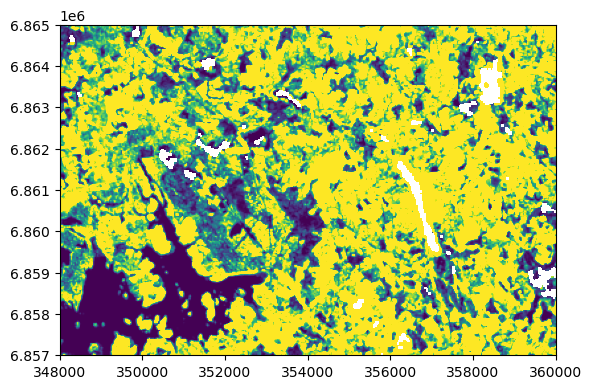

/appl/data/geo/luke/vmi/2021/ppa_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


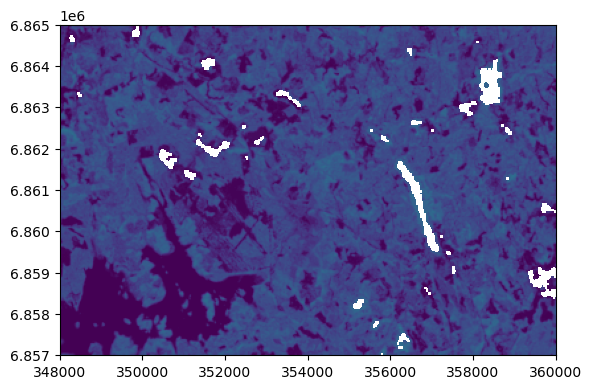

/appl/data/geo/luke/vmi/2021/kuusitukki_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


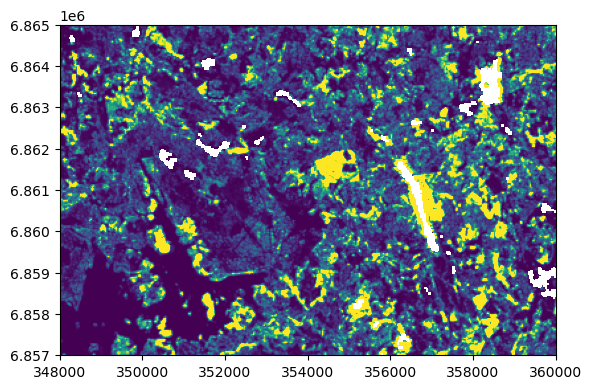

/appl/data/geo/luke/vmi/2021/bm_lehtip_neulaset_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


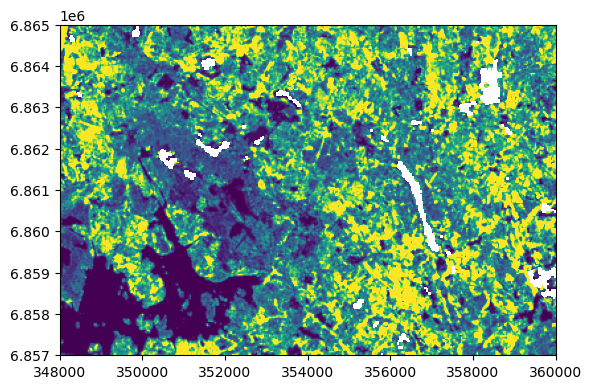

/appl/data/geo/luke/vmi/2021/muulp_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


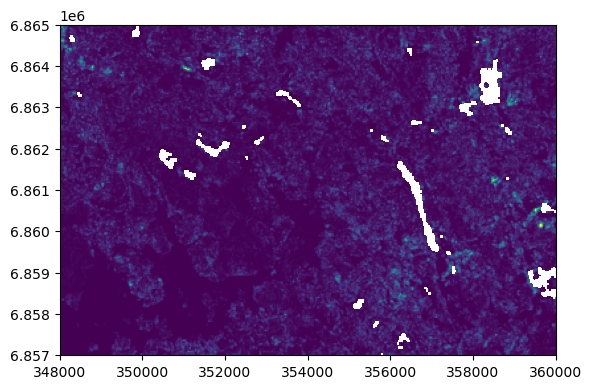

/appl/data/geo/luke/vmi/2021/bm_manty_juuret_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


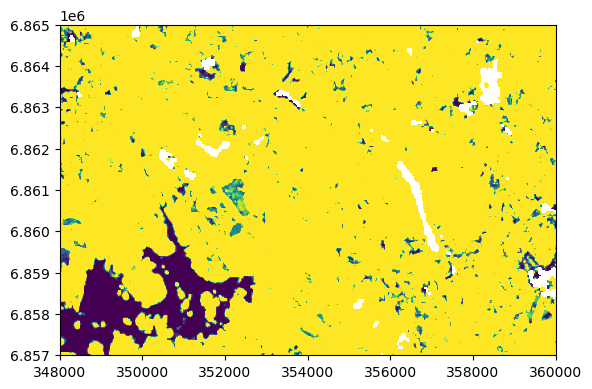

/appl/data/geo/luke/vmi/2021/bm_lehtip_runkokuori_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


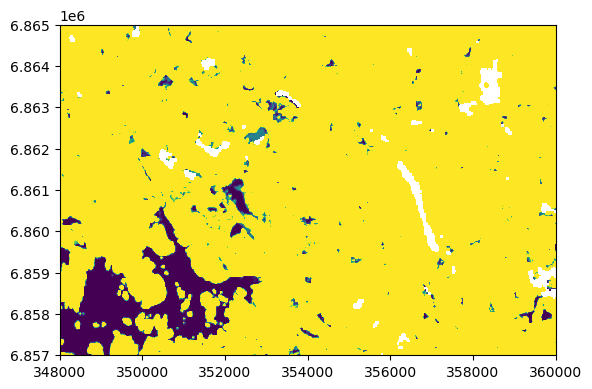

/appl/data/geo/luke/vmi/2021/fra_luokka_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


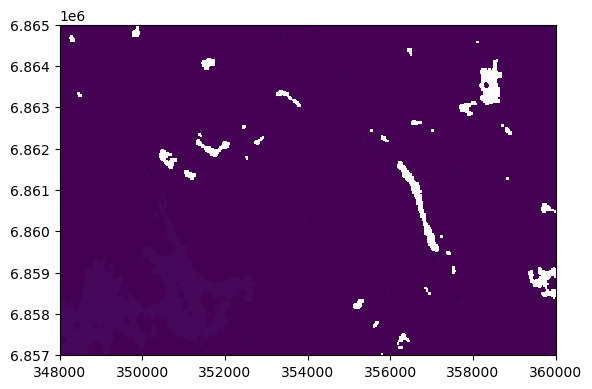

/appl/data/geo/luke/vmi/2021/bm_kuusi_juuret_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


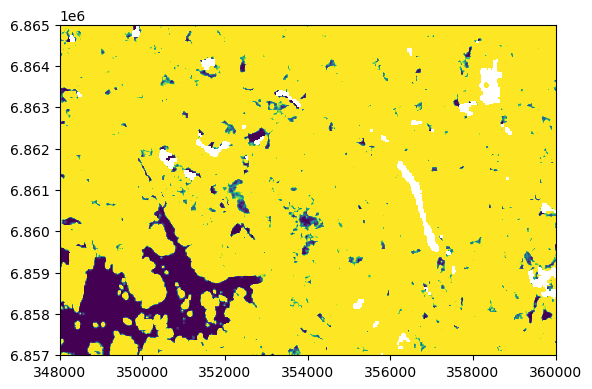

/appl/data/geo/luke/vmi/2021/mantykuitu_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


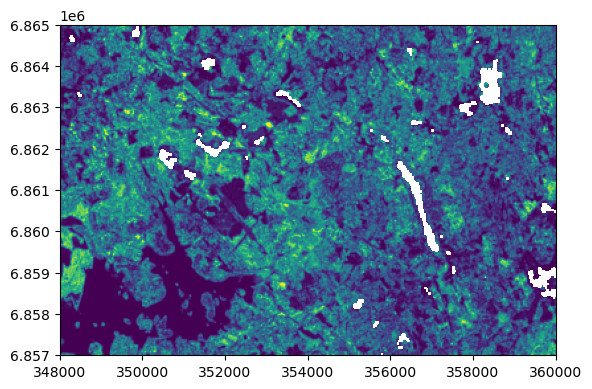

/appl/data/geo/luke/vmi/2021/keskipituus_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


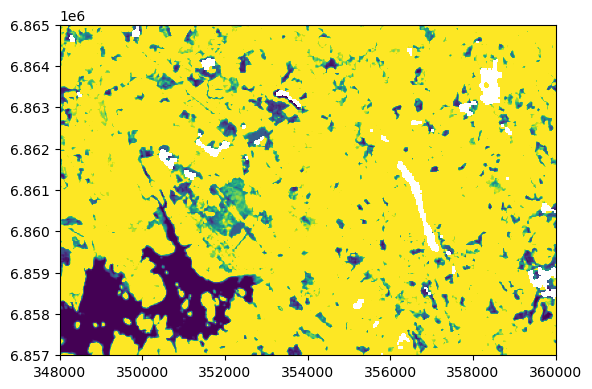

/appl/data/geo/luke/vmi/2021/kuusi_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


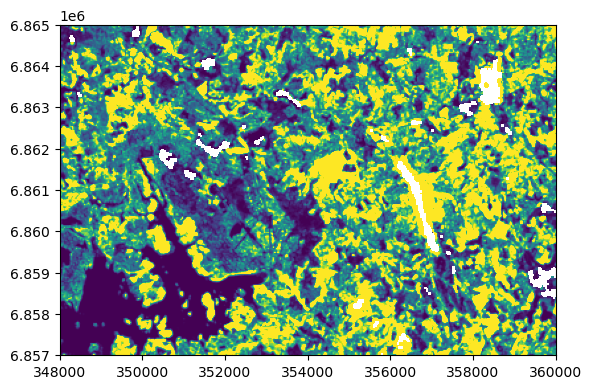

/appl/data/geo/luke/vmi/2021/koivukuitu_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


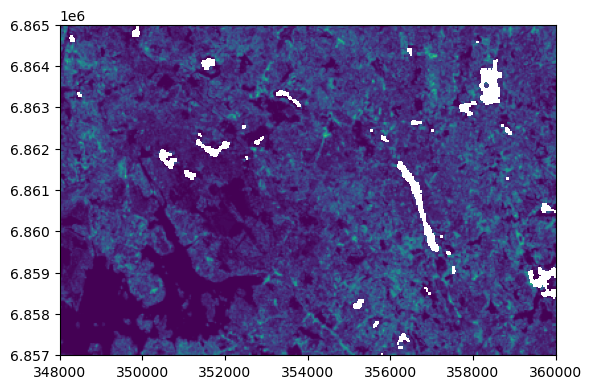

/appl/data/geo/luke/vmi/2021/tilavuus_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


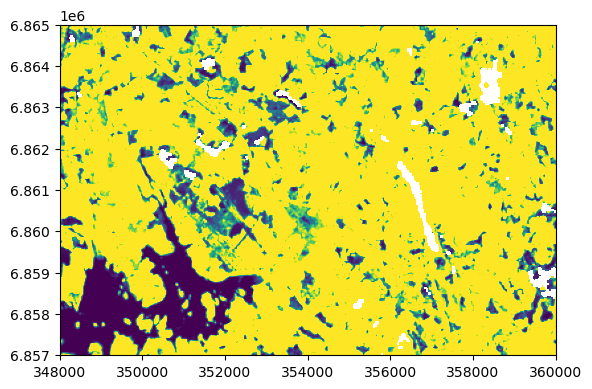

/appl/data/geo/luke/vmi/2021/bm_kuusi_neulaset_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


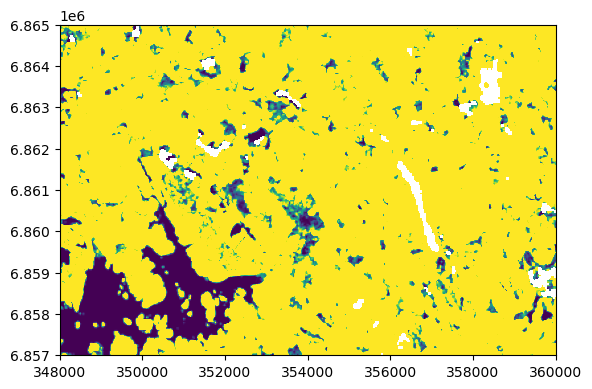

/appl/data/geo/luke/vmi/2021/mista_vmi1x_1721.img
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


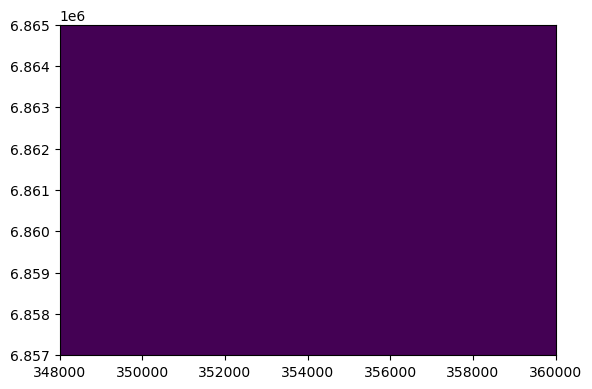

/appl/data/geo/luke/vmi/2021/bm_lehtip_elavatoksat_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


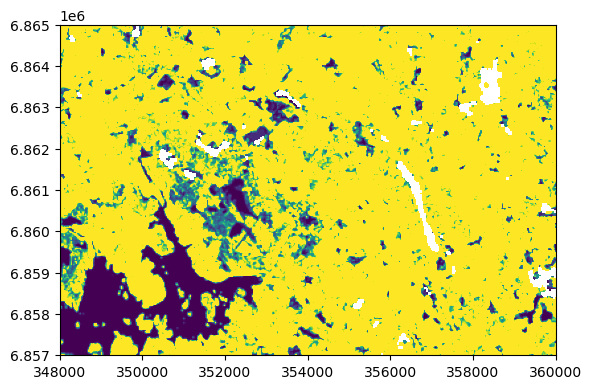

/appl/data/geo/luke/vmi/2021/bm_lehtip_kanto_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


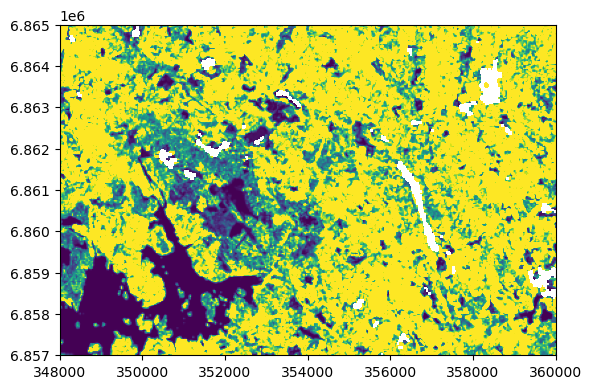

/appl/data/geo/luke/vmi/2021/bm_manty_kuolleetoksat_vmi1x_1721.img
*** Data has 31894 non land values (=32767) ***
*** non land interpolated ***
*** resampled with a scalefactor of 0.5 ***


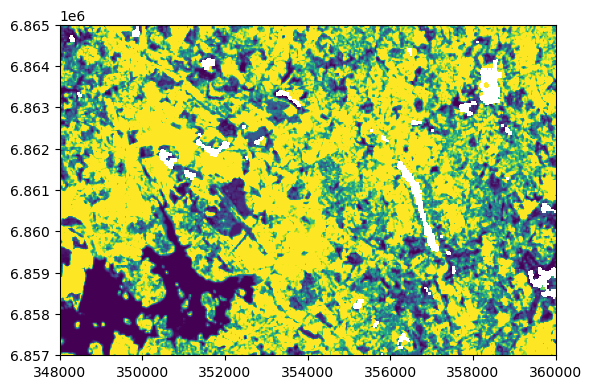

In [6]:
#new_subset = [348000,6857000,360000,6865000]
new_subset = subset.copy()
fd = r'/appl/data/geo/luke/vmi/2021'
out_fd = r'/scratch/project_2000908/nousu/GISPUTS/Kuivalake_Catchment/GIS_inputs/kuivajarvi/vmi_32_noroads/'
layer = r'ika_vmi1x_1721.img'
vmi_from_puhti(fd=fd, subset=new_subset, out_fd=out_fd, layer='all', interpolate=1, use_center=None, resample=0.5, plot=True, save_in='asc')
# 0.5 resamples 16m data to 32m

In [7]:
import rasterio
import matplotlib.pyplot as plt

file_roads = r'/scratch/project_2000908/nousu/GISPUTS/Kuivalake_Catchment/GIS_inputs/kuivajarvi/vmi_32_roads/keskipituus_vmi1x_1721.asc'
file_noroads = r'/scratch/project_2000908/nousu/GISPUTS/Kuivalake_Catchment/GIS_inputs/kuivajarvi/vmi_32_noroads/keskipituus_vmi1x_1721.asc'

with rasterio.open(file_roads) as src:
    roads = src.read(1)
    rmeta = src.meta

with rasterio.open(file_noroads) as src:
    noroads = src.read(1)
    nrmeta = src.meta

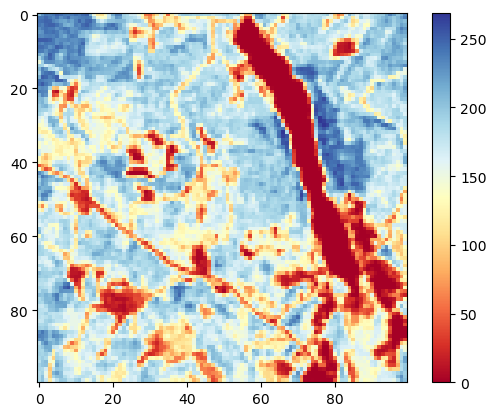

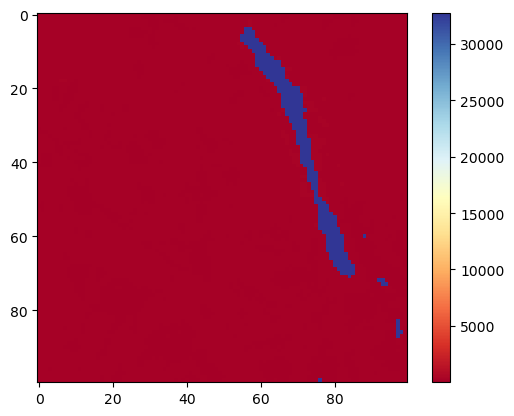

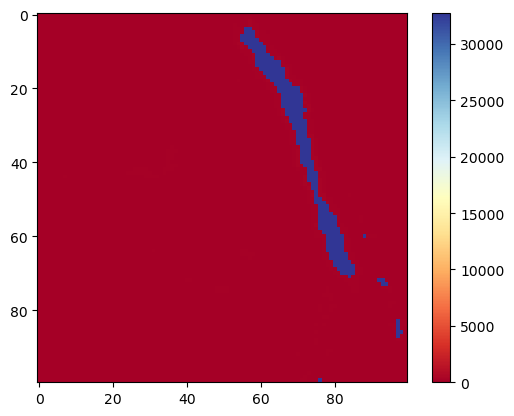

In [10]:
#windows = [100:200, 100:200]
plt.figure(1)
plt.imshow(roads[100:200, 200:300], cmap='RdYlBu')
plt.colorbar()
plt.figure(2)
plt.imshow(noroads[100:200, 200:300], cmap='RdYlBu')
plt.colorbar()
plt.figure(3)
plt.imshow(noroads[100:200, 200:300]-roads[100:200, 200:300], cmap='RdYlBu')
plt.colorbar()

#### Loading GTK soil data

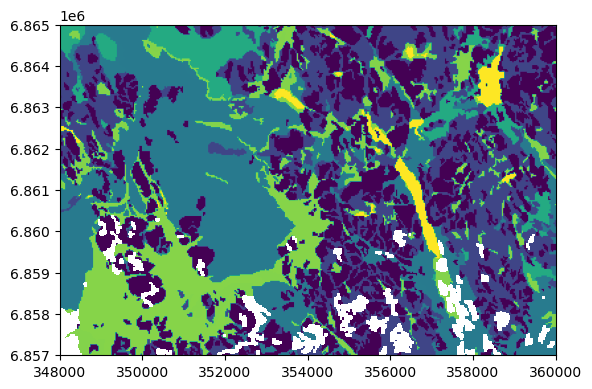

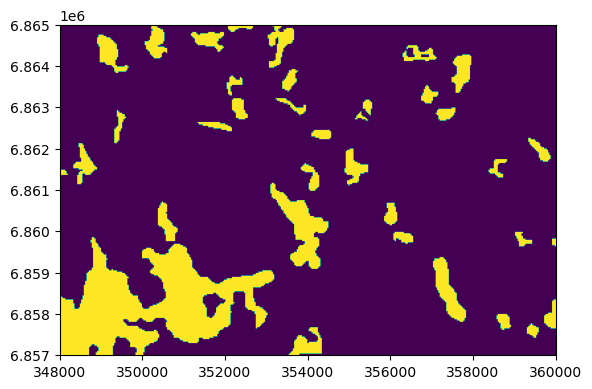

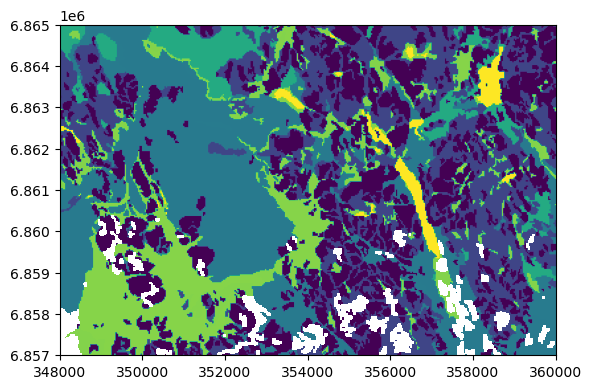

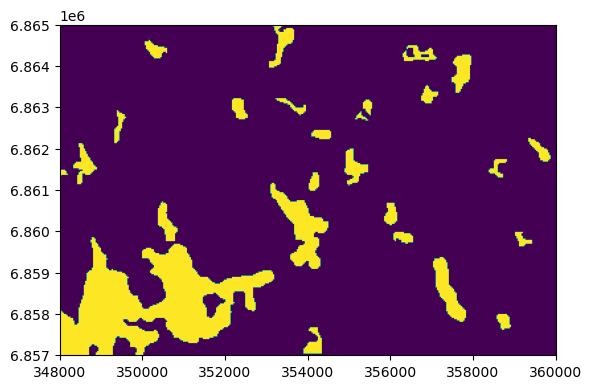

In [13]:
#### Loading GTK soil data
#new_subset = [350016.0, 6858072.0, 357856.0, 6864536.0]

out_fd_s = r'/scratch/project_2000908/nousu/GISPUTS/Kuivalake_Catchment/GIS_inputs/kuivajarvi/soil_32/'
ref_raster = r'/scratch/project_2000908/nousu/GISPUTS/Kuivalake_Catchment/GIS_inputs/kuivajarvi/dem_32/cmask_d8_0_fill.asc'

soilmap_from_puhti(soilmap=20, subset=new_subset, out_fd=out_fd_s, ref_raster=ref_raster, soildepth='surface', plot=True, save_in='asc')
soilmap_from_puhti(soilmap=200, subset=new_subset, out_fd=out_fd_s, ref_raster=ref_raster, soildepth='surface', plot=True, save_in='asc')
soilmap_from_puhti(soilmap=20, subset=new_subset, out_fd=out_fd_s, ref_raster=ref_raster, soildepth='bottom', plot=True, save_in='asc')
soilmap_from_puhti(soilmap=200, subset=new_subset, out_fd=out_fd_s, ref_raster=ref_raster, soildepth='bottom', plot=True, save_in='asc')

#### Loading MML maastotietokanta data

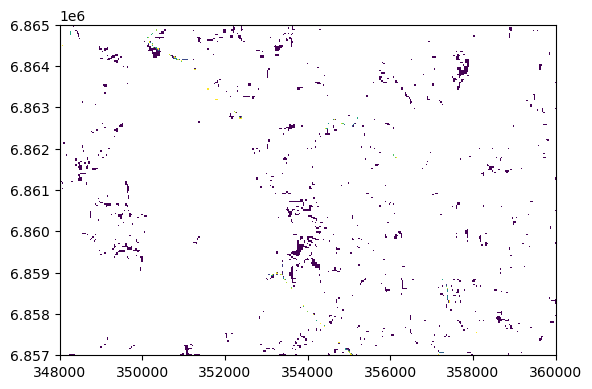

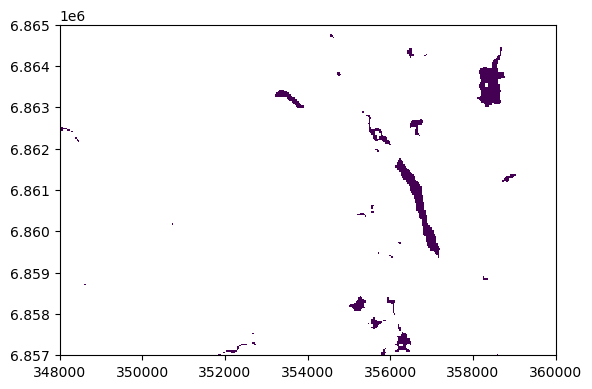

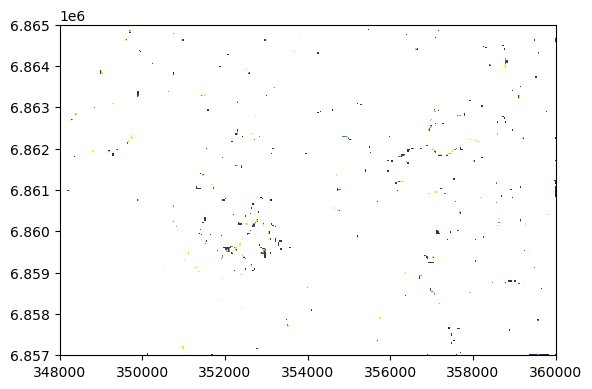

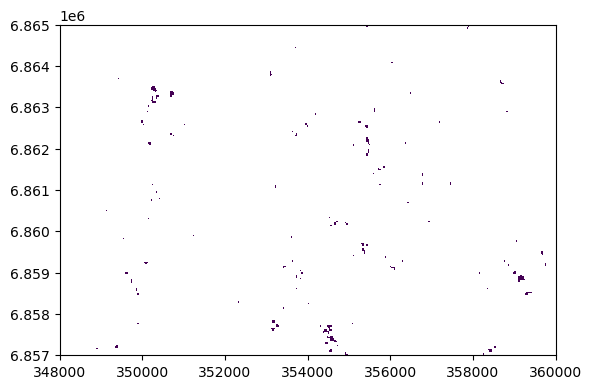

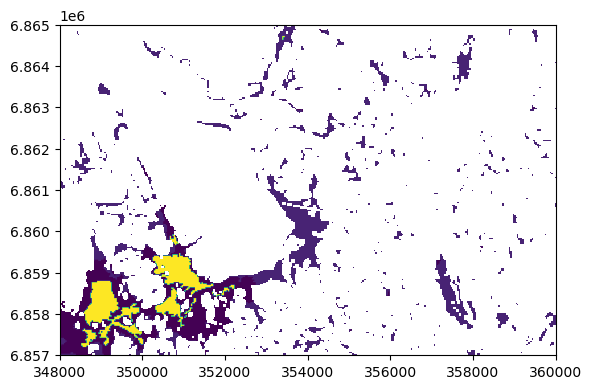

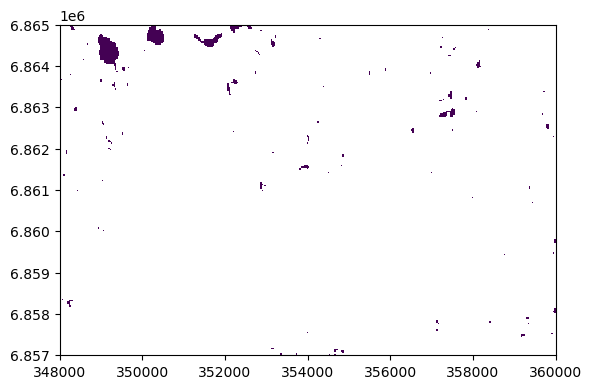

In [19]:
#new_subset = [350016.0, 6858072.0, 357856.0, 6864536.0]
vive_fn = r'/appl/data/geo/mml/maastotietokanta/2023/gpkg/MTK-virtavesi_23-03-02.gpkg'
vave_fn = r'/appl/data/geo/mml/maastotietokanta/2023/gpkg/MTK-vakavesi_23-03-02.gpkg'
tie_fn = r'/appl/data/geo/mml/maastotietokanta/2023/gpkg/MTK-tie_23-03-02.gpkg'
suo_fn = r'/appl/data/geo/mml/maastotietokanta/2023/gpkg/MTK-suo_23-03-02.gpkg'
kallio_fn = r'/appl/data/geo/mml/maastotietokanta/2023/gpkg/MTK-kallio_23-03-02.gpkg'
ref_raster = r'/scratch/project_2000908/nousu/GISPUTS/Kuivalake_Catchment/GIS_inputs/kuivajarvi/dem_32/cmask_d8_0_fill.asc'
out_fd_m = r'/scratch/project_2000908/nousu/GISPUTS/Kuivalake_Catchment/GIS_inputs/kuivajarvi/maastotietokanta_32'

maastolayer_to_raster(in_fn=vive_fn, out_fd=out_fd_m, layer='virtavesikapea', ref_raster=ref_raster)
maastolayer_to_raster(in_fn=vave_fn, out_fd=out_fd_m, layer='jarvi', ref_raster=ref_raster)
maastolayer_to_raster(in_fn=tie_fn, out_fd=out_fd_m, layer='tieviiva', ref_raster=ref_raster)
maastolayer_to_raster(in_fn=kallio_fn, out_fd=out_fd_m, layer='kallioalue', ref_raster=ref_raster)
for layer in ['suo', 'soistuma']:
    maastolayer_to_raster(in_fn=suo_fn, out_fd=out_fd_m, layer=layer, ref_raster=ref_raster)

In [1]:
import rasterio
from rasterio.windows import from_bounds
import matplotlib.pyplot as plt
import numpy as np
from rasterio.plot import show
from tools import open_raster_with_subset, resample_raster

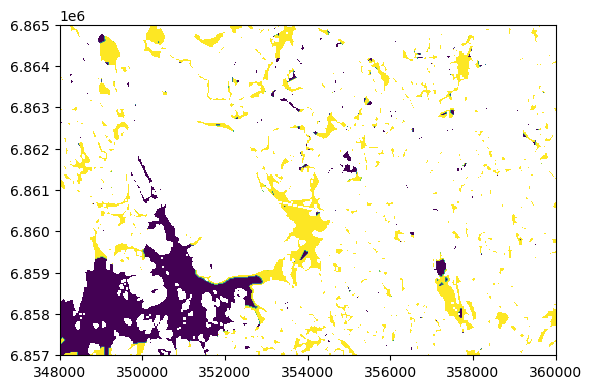

In [2]:
file = r'/appl/data/geo/syke/soidenojitustilanne/SoidenOjitustilanne.tif'
out_fp = r'/scratch/project_2000908/nousu/GISPUTS/Kuivalake_Catchment/GIS_inputs/kuivajarvi/temp/ojitus_25.tif'
subset = [348000,6857000,360000,6865000] # coordinate box of the dem, KUIVAJARVI

open_raster_with_subset(fp=file, out_fp=out_fp, subset=subset)

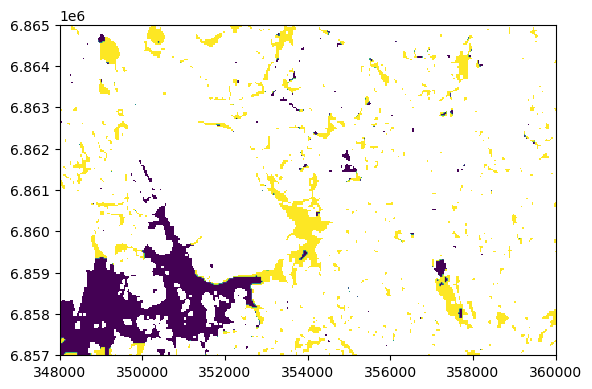

(<open DatasetReader name='/scratch/project_2000908/nousu/GISPUTS/Kuivalake_Catchment/GIS_inputs/kuivajarvi/syke_32/peatland_drainage.asc' mode='r'>,
 '/scratch/project_2000908/nousu/GISPUTS/Kuivalake_Catchment/GIS_inputs/kuivajarvi/syke_32/peatland_drainage.asc')

In [3]:
# NOW SHOULD RESAMPLE IT TO 32M TO FIT THE OTHER LAYERS!
from tools import resample_raster
fp = r'/scratch/project_2000908/nousu/GISPUTS/Kuivalake_Catchment/GIS_inputs/kuivajarvi/temp/ojitus_25.tif'
out_fp = r'/scratch/project_2000908/nousu/GISPUTS/Kuivalake_Catchment/GIS_inputs/kuivajarvi/syke_32/peatland_drainage.asc'
resample_raster(fp, out_fp, scale_factor=0.78125, resampling_method='nearest', plot=True, save_in='asc')

In [36]:
# THEN SHOULD CREATE A MASK WHERE PEATLAND HAVE BEEN DRAINED

In [37]:
# THEN SHOULD FIND AND FILL AVERAGE CANOPY FOR EACH SITE TYPE

In [38]:
# THEN SHOULD DELETE ALL DITCHES UNDER THE MASK